# Test implementation of the Eclat FPM and kmeans clustering algorithm against CTU-13 Dataset

* This is a test implementation of the Eclat frequent pattern mining algorithm against the categorical variables contained within the netflow captures, along with the kmeans clustering algorithm applied against the continuous variables within the netflow data.

* Our aim is to find the intersection of the TransactionIDs within the frequent itemsets that are found within the dataset along with the outliers in the clusters that are formed from the continuous dataset.

* Depending on your R installation you may need to install the following libraries :

```python
install.packages("arules")
install.packages("arulesViz")
install.packages("plyr")
install.packages("snow")
install.packages("rgl")
install.packages("RColorBrewer")
install.packages("scales")
```

### 1. Prep and load requirements into namespace and define cluster for parallel computation

In [68]:
# Library imports
## TODO: function to install and load libariries dynamically

library(arules)
library(arulesViz)
library(plyr)
library(snow)
library(rgl)
library(RColorBrewer)
library(scales)
library(nortest)

In [2]:
# Create CPU cluster for parallelization (this uses the snow package)

cluster <- makeCluster(23)

### 2. ETL Data from binetflow files

In [3]:
# Create Class for formatting of the TimeStamp field contained within the netflow captures

setClass("myPosixCt")
setAs("character", "myPosixCt", function(from) as.POSIXct(from, format = "%Y/%m/%d %H:%M:%OS"))
options(set.seconds="6")

In [4]:
# Reading .binetflow file into dataframe

flowdata_csv <- read.csv("capture20110810.binetflow", colClasses = c("myPosixCt", "numeric", "factor", "factor","factor","factor","factor","factor","factor","factor","factor","numeric", "numeric", "numeric", "factor"), strip.white = TRUE, sep = ',')

In [5]:
# Define function for minute conversion

mins <- function(m){
    x <- m * 60
    return(x)
}

# Subset flowdata_csv dataframe into t(start) + 10mins
# TODO: convert to function for iterative subsetting over entire dataframe

subset1 <- subset(flowdata_csv, flowdata_csv$StartTime[1] + mins(1) >= flowdata_csv$StartTime)

In [6]:
# Define categorical vars, subset flowdata, and save as CSV

catvars <- names(subset1) %in% c("StartTime", "Dur", "Dir", "State", "sTos", "dTos", "TotPkts", "TotBytes", "SrcBytes")
flowdata_cats <- subset1[!catvars]

# Clean the NA and 0 values from the data

flowdata_cats <- na.omit(flowdata_cats)
flowdata_cats_row_sub <- parRapply(cluster, flowdata_cats, function(row) all( row != 0))
flowdata_cats <- flowdata_cats[flowdata_cats_row_sub,]

# Write out to csv file

write.csv(flowdata_cats, file='flowdata_cats.csv')

In [7]:
#Define continuous vars, subset flowdata and save as CSV

contvars <- names(subset1) %in% c("StartTime", "Proto", "SrcAddr", "Sport", "Dir", "DstAddr", "Dport", "State", "Label","sTos", "dTos")
flowdata_conts <- subset1[!contvars]

#Clean the NA and 0 values from the data

flowdata_conts <- na.omit(flowdata_conts)
flowdata_conts_row_sub <- parRapply(cluster, flowdata_conts, function(row) all( row != 0))
flowdata_conts <- flowdata_conts[flowdata_conts_row_sub,]

# Write out to csv file

write.csv(flowdata_conts, file='flowdata_conts.csv')

In [8]:
#Visual inspection that this is how we want the continuous vars to look

head(flowdata_conts, n=5)

,Dur,TotPkts,TotBytes,SrcBytes
1,1.026539,4,276,156
2,1.009595,4,276,156
3,3.056586,3,182,122
4,3.111769,3,182,122
5,3.083411,3,182,122


In [9]:
#Visual inspection that this is how we want the categorical vars to look

head(flowdata_cats, n=5)

,Proto,SrcAddr,Sport,DstAddr,Dport,Label
1,tcp,94.44.127.113,1577,147.32.84.59,6881,flow=Background-Established-cmpgw-CVUT
2,tcp,94.44.127.113,1577,147.32.84.59,6881,flow=Background-Established-cmpgw-CVUT
3,tcp,147.32.86.89,4768,77.75.73.33,80,flow=Background-TCP-Attempt
4,tcp,147.32.86.89,4788,77.75.73.33,80,flow=Background-TCP-Attempt
5,tcp,147.32.86.89,4850,77.75.73.33,80,flow=Background-TCP-Attempt


### 3. Execute eclat over categorical vars to find patterns in data

In [10]:
#Read transactions from categorical data (for use within eclat implementation)

data <- read.transactions("flowdata_cats.csv", format="basket", sep=",", rm.duplicates = TRUE)

distribution of transactions with duplicates:
items
  1   2 
126   1 


In [11]:
# Execute eclat algorithm over transactions
## tidLists required for returning the TID list of all discovered frequent patterns

rules <- eclat(data, parameter = list(supp = .001, target = "frequent itemsets", tidLists = TRUE))


parameter specification:
 tidLists support minlen maxlen            target   ext
     TRUE   0.001      1     10 frequent itemsets FALSE

algorithmic control:
 sparse sort verbose
      7   -2    TRUE

eclat - find frequent item sets with the eclat algorithm
version 2.6 (2004.08.16)         (c) 2002-2004   Christian Borgelt
create itemset ... 
set transactions ...[28365 item(s), 11783 transaction(s)] done [0.02s].
sorting and recoding items ... [114 item(s)] done [0.00s].
creating sparse bit matrix ... [114 row(s), 11783 column(s)] done [0.00s].
writing  ...  180 183 357 860 986 1695 2985 4386 5577 6657 6894 11042 180 183 357 860 986 1695 2985 4386 5577 6657 6894 11042 180 183 357 860 986 1695 2985 4386 5577 6657 6894 11042 1628 2654 3056 3675 4497 4697 4839 5994 6535 6863 8961 9067 249 1239 1246 1560 5577 5911 6158 7980 9159 9209 10847 10907 156 2399 3131 3383 5595 5901 5902 7033 8628 9622 11079 11480 11573 105 1092 1405 1423 1522 1523 1604 1618 2595 3370 3371 3373 3374 3380 105 1092

In [12]:
# Coerce the tidLists to list format

tidlist <- as(tidLists(rules), "list")

### 4. Execute Log, PCA and kmeans of continuous vars to find existing clusters in the data

In [97]:
# Run Log function over continuous features
log.flowdata_conts <- log(flowdata_conts)

# Scale logged continuous features
scaled.flowdata <- scale(log.flowdata_conts)

Importance of components:
                          Comp.1    Comp.2     Comp.3     Comp.4
Standard deviation     1.8465979 0.7006699 0.22848445 0.21583964
Proportion of Variance 0.8525547 0.1227452 0.01305241 0.01164769
Cumulative Proportion  0.8525547 0.9752999 0.98835231 1.00000000

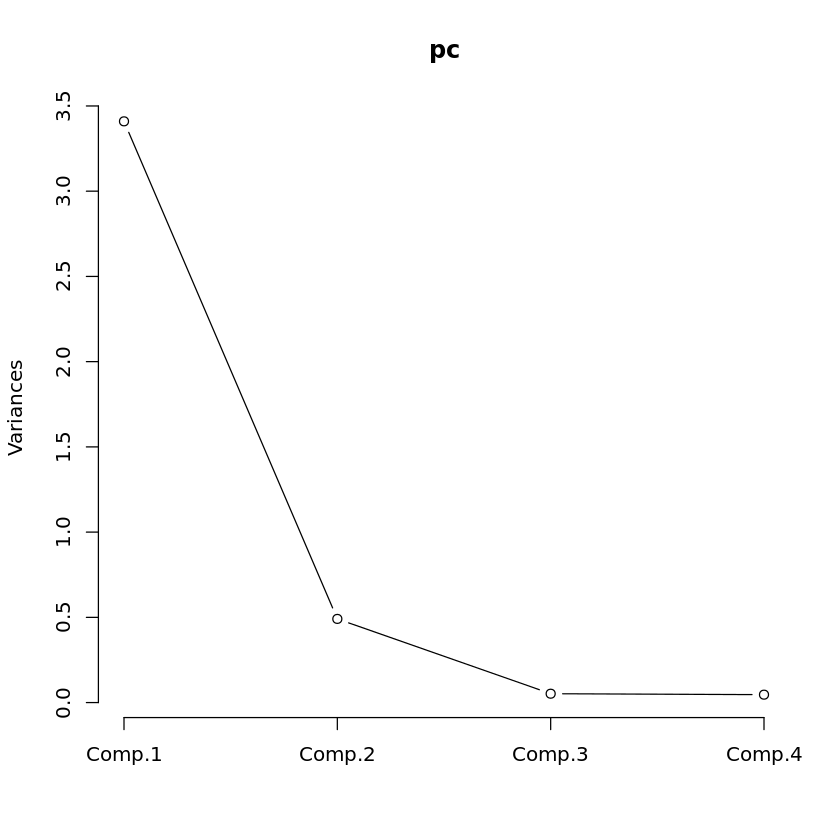

In [29]:
# Apply PCA to identify components that house 85%+ of the variance in the data
pc <- princomp(scaled.flowdata)

# Plot PCA
plot(pc, type = "line")

summary(pc)

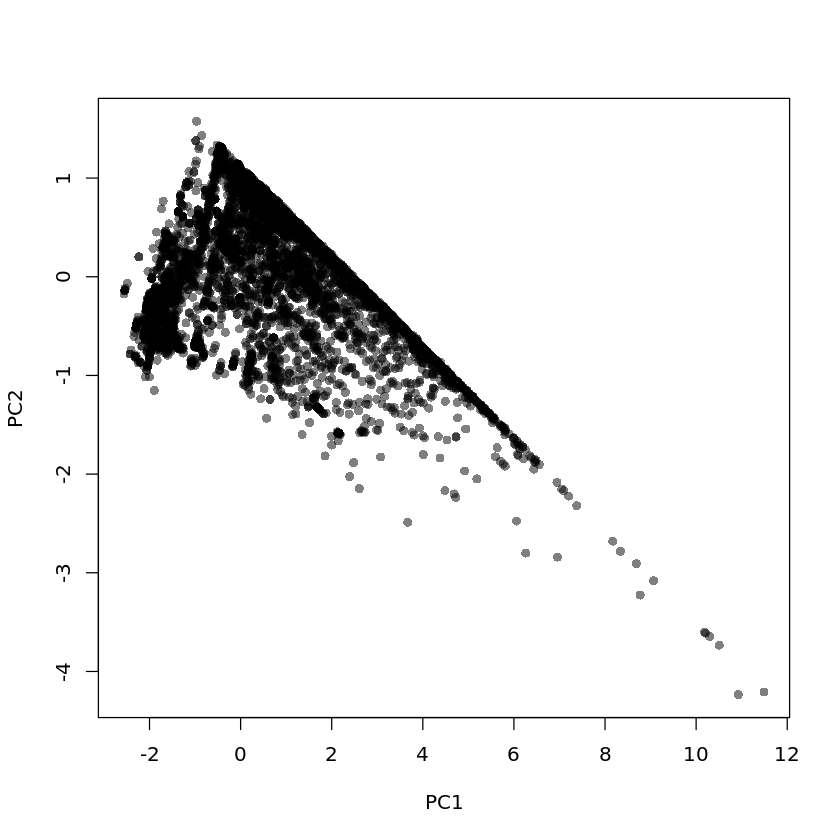

In [30]:
# Run PCA over scaled data
conts.pca2 <- prcomp(scaled.flowdata)

# Create new dataframe of identified principle components
comp <- data.frame(conts.pca2$x[,1:2])
plot(comp, pch=16, col=rgb(0,0,0,0.5))

In [67]:
# 3D plot the principal components ## ONLY WORKS OUTSIDE JUPYTER NOTEBOOK ##

#plot3d(comp$PC1, comp$PC2)
head(conts.pca2, n=10)

,PC1,PC2,PC3,PC4
Dur,0.41997693,0.90012608,-0.11448909,-0.01687209
TotPkts,0.5275980,-0.1932541,0.3025254,0.7699166
TotBytes,0.5167197,-0.3419602,-0.7729915,-0.1361913
SrcBytes,0.5275040,-0.1883856,0.5457608,-0.6232139
,PC1,PC2,PC3,PC4
1,-0.8980763,0.2598960,0.1292865,0.1152266
2,-0.8990719,0.2577622,0.1295579,0.1152666
3,-1.12415692,0.54178905,0.16259970,0.08944737
4,-1.12308658,0.54408307,0.16230792,0.08940437
5,-1.12363422,0.54290932,0.16245721,0.08942638


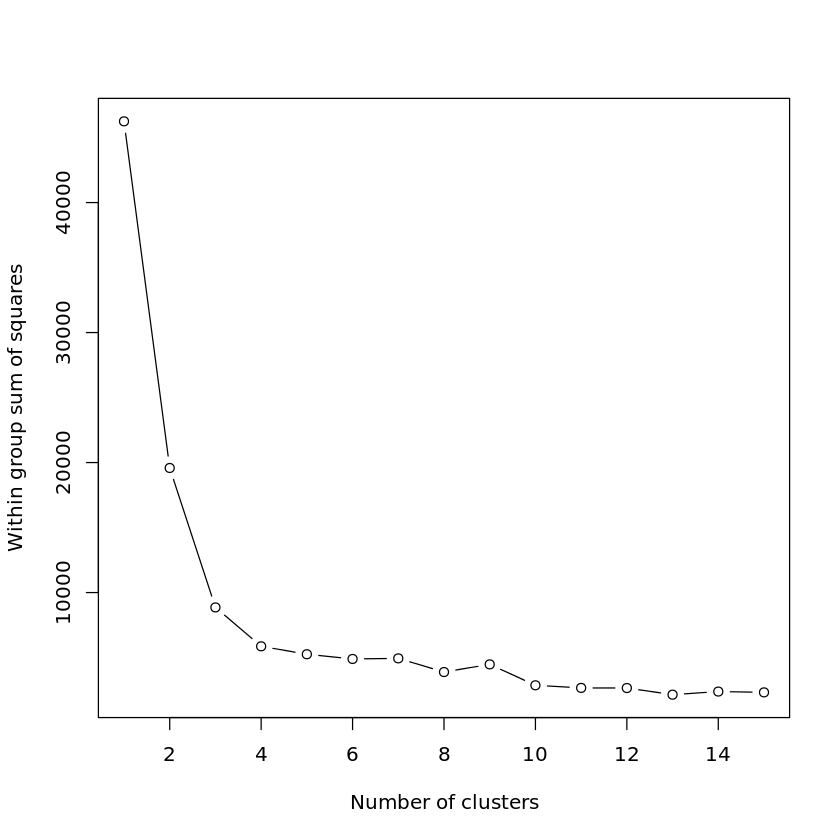

In [35]:
# Find 'elbow' to determine cluster centroid count 
# (this is actually not necessarily the best method for determining centroid count, 
# best is to understand the application of what we're using clustering for)

wss <- (nrow(scaled.flowdata)-1)*sum(apply(scaled.flowdata,2,var))
for (i in 2:15) wss[i] <- sum(kmeans(scaled.flowdata,
                                    centers=i)$withinss)
plot(1:15, wss, type = "b", xlab = "Number of clusters",
    ylab = "Within group sum of squares")

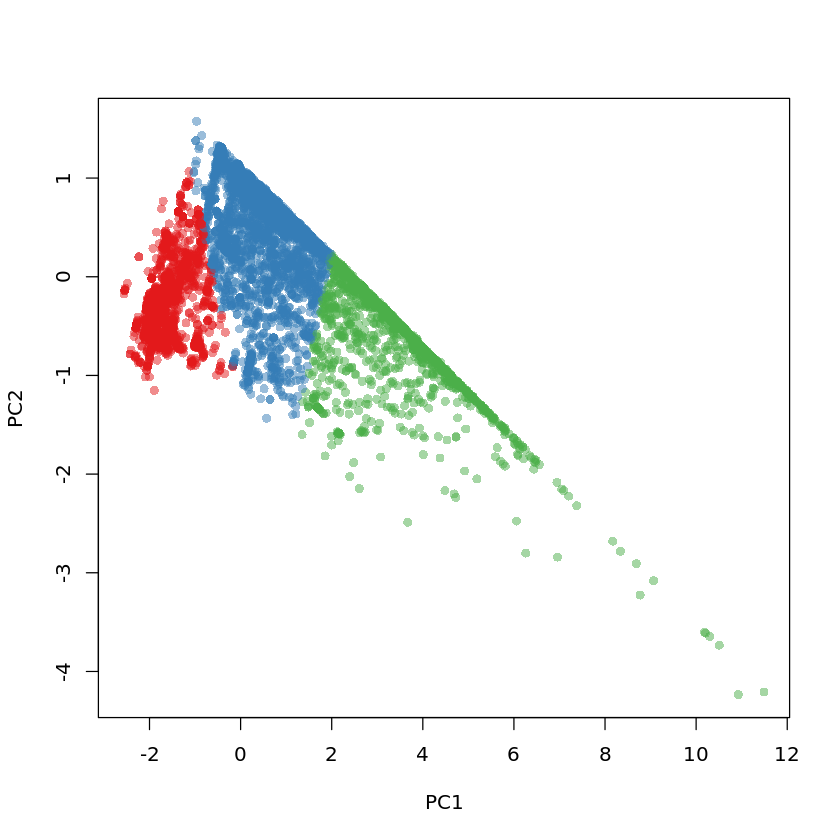

In [36]:
# Execute k-means over identified principal components
# centroid count gleaned from elbow calculation above
## nstart and iter.max based on identified best practices

k <- kmeans(comp, 3, nstart=15, iter.max=1000)

# Plot results of clustering

palette(alpha(brewer.pal(9, 'Set1'), 0.5))
plot(comp, col=k$clus, pch=16)

In [54]:
# Find cluster sizes
sort(table(k$clust))
clust <- names(sort(table(k$clust)))

# Coerce first cluster into list
cluster1.tids <- as.list(as.numeric(row.names(flowdata_conts[k$clust==clust[1],])))

# Coerce second cluster into list
cluster2.tids <- as.list(as.numeric(row.names(flowdata_conts[k$clust==clust[2],])))

# Coerce third cluster into list
cluster3.tids <- as.list(as.numeric(row.names(flowdata_conts[k$clust==clust[3],])))

# Append cluster assignment to original dataframe 
flowdata_conts_k <- data.frame(flowdata_conts, k$cluster)

3    1    2 
1723 4678 5163

In [59]:
# Run cluster3 through Gaussian function to find outliers
head(flowdata_conts_k, n=100)

,Dur,TotPkts,TotBytes,SrcBytes,k.cluster
1,1.026539,4,276,156,1
2,1.009595,4,276,156,1
3,3.056586,3,182,122,1
4,3.111769,3,182,122,1
5,3.083411,3,182,122,1
6,3.097288,3,182,122,1
102,3550.182,12,875,413,2
103,0.000883,2,135,75,1
104,0.000326,2,120,60,1
105,0.056966,3,180,120,1


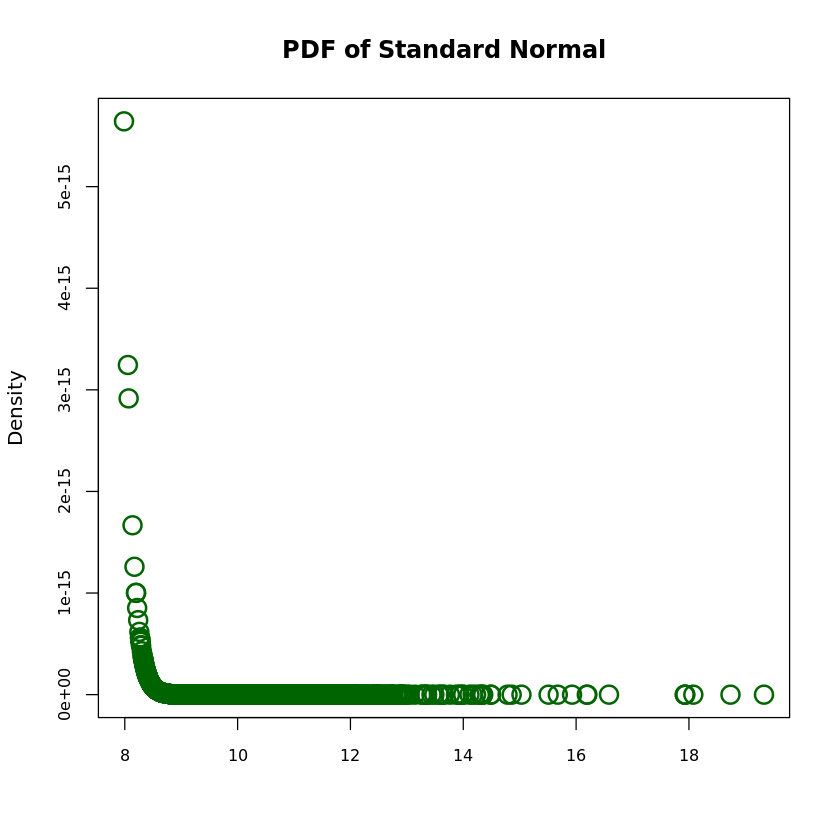

In [96]:
# Subset cluster3 to find outliers
cluster3.trans <- subset(flowdata_conts_k, k.cluster == "3")

# Run normality over
log.cluster3.trans <- log(cluster3.trans[,1:4])
flowdata_densities <- dnorm(log.cluster3.trans[,3], 0,1)

plot(log.cluster3.trans[,3], flowdata_densities, col='darkgreen', xlab='', ylab='Density', 
     lwd=2, cex=2, main="PDF of Standard Normal", cex.axis = .8)

Importance of components:
                          PC1    PC2     PC3     PC4
Standard deviation     1.6533 1.0364 0.35218 0.26172
Proportion of Variance 0.6834 0.2685 0.03101 0.01712
Cumulative Proportion  0.6834 0.9519 0.98288 1.00000

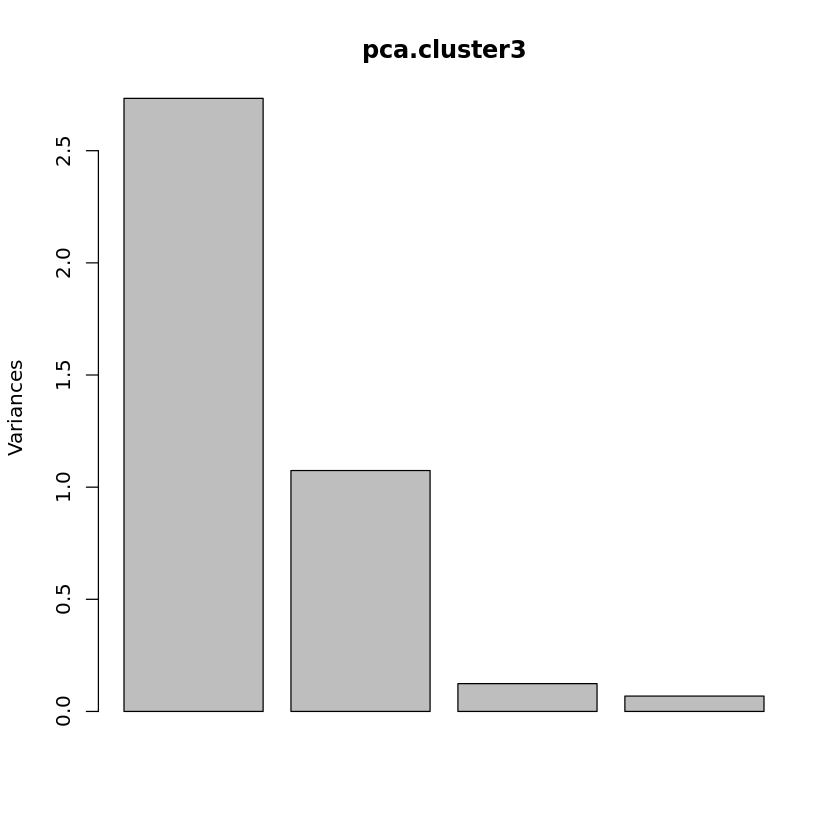

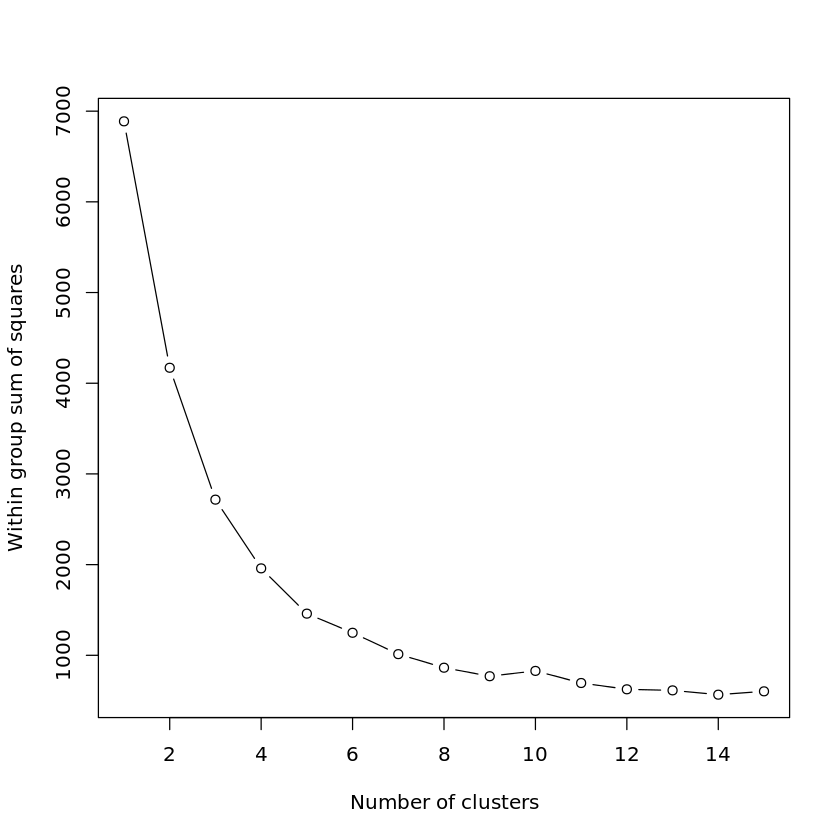

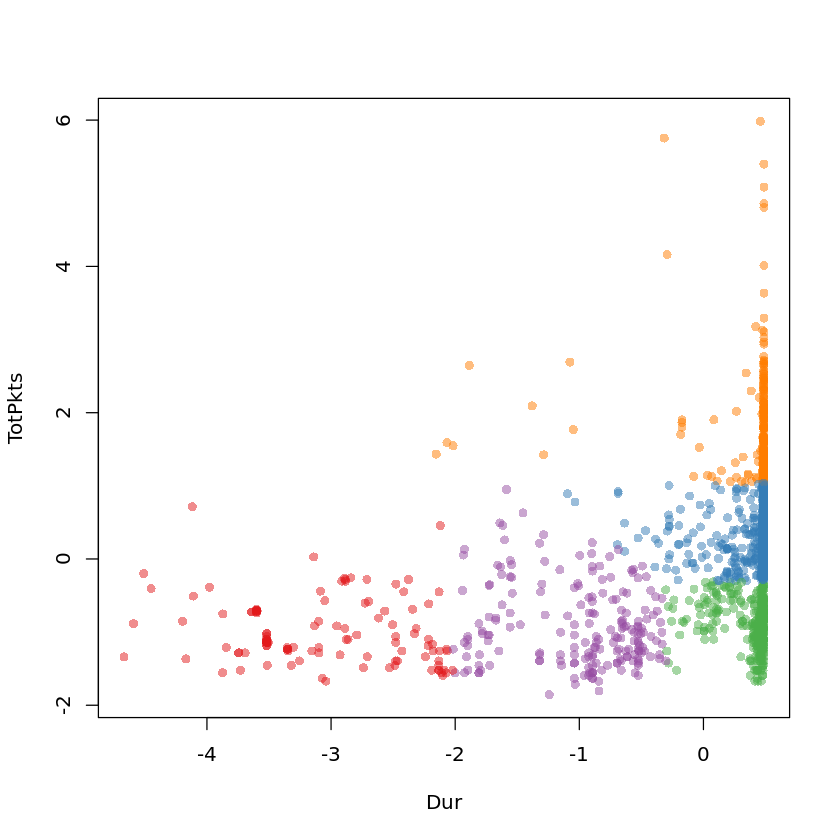

In [106]:
# Scale cluster 3 vars
scaled.cluster3.trans <- scale(log.cluster3.trans)

# Execute PCA over cluster 3 vars
pca.cluster3 <- prcomp(scaled.cluster3.trans)
summary(pca.cluster3)

# Find PC's for all members of cluster 3
plot(pca.cluster3)

# Create new df housing cluster 3 PCs

cluster3.comp <- data.frame(scaled.cluster3.trans[,1:2])

# Find elbow for cluster 3

wss <- (nrow(scaled.cluster3.trans)-1)*sum(apply(scaled.cluster3.trans,2,var))
for (i in 2:15) wss[i] <- sum(kmeans(scaled.cluster3.trans,
                                    centers=i)$withinss)
plot(1:15, wss, type = "b", xlab = "Number of clusters",
    ylab = "Within group sum of squares")
    
# kmeans over 5 clusters for top 2 PC's in Cluster 3
    
cluster3.k <- kmeans(cluster3.comp, 5, nstart=15, iter.max=2000)

# Plot results of clustering

palette(alpha(brewer.pal(9, 'Set1'), 0.5))
plot(cluster3.comp, col=cluster3.k$clus, pch=16)

In [110]:
cluster3.comp.k <- data.frame(cluster3.trans, cluster3.k$cluster)

str(cluster3.comp.k)

'data.frame':	1723 obs. of  6 variables:
 $ Dur               : num  3086.5 20.4 1065 3600 37.9 ...
 $ TotPkts           : num  591 133 156 72157 1921 ...
 $ TotBytes          : num  45931 81929 14804 61638544 2636496 ...
 $ SrcBytes          : num  26480 67597 7699 60214264 2625276 ...
 $ k.cluster         : int  3 3 3 3 3 3 3 3 3 3 ...
 $ cluster3.k.cluster: int  5 4 2 5 5 2 5 2 2 5 ...


### 5. Find intersection of FP and kmeans TID lists

In [27]:
intersect(tidlist[[100]], cluster2.tids)

[[1]]
[1] 7520

[[2]]
[1] 7846

[[3]]
[1] 7847